# 🔬 Auditoría del Preprocesamiento de Audio

**TFG — Reconocimiento de Emociones Musicales**

Este notebook disecciona paso a paso el pipeline de preprocesamiento implementado en
`src/audio_utils.py` (`AudioPreprocessor`), y luego realiza un control de calidad
sobre **todos** los archivos descargados.

| Sección | Objetivo |
|---------|----------|
| **1 — Disección del preprocesamiento** | Entender *visualmente* cada transformación |
| **2 — Control de calidad** | Detectar archivos corruptos / silenciosos |

In [25]:
# ── Imports ──────────────────────────────────────────────────────────
import sys, os, glob, random, warnings
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd

warnings.filterwarnings("ignore", category=FutureWarning)

# Añadir la carpeta raíz del proyecto al path
PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), ".."))
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

from src.audio_utils import AudioPreprocessor

# Estilo global de gráficos
plt.rcParams.update({
    "figure.facecolor": "white",
    "axes.facecolor":   "#fafafa",
    "axes.grid":        True,
    "grid.alpha":       0.3,
    "font.size":        11,
})

AUDIO_DIR = os.path.join(PROJECT_ROOT, "data", "audio")
print(f"Directorio de audio: {AUDIO_DIR}")
# El "**" significa: busca en cualquier subcarpeta recursivamente
audio_files = sorted(glob.glob(os.path.join(AUDIO_DIR, "**", "*.mp3"), recursive=True))
print(f"Archivos encontrados: {len(audio_files)}")

Directorio de audio: c:\Users\Usuario\OneDrive - UNIVERSIDAD DE MURCIA\Escritorio\CIENCIA DE DATOS RUBEN\CUARTO\TFG_Emociones\data\audio
Archivos encontrados: 200


---
## Sección 1 — Disección del Preprocesamiento

Vamos a tomar **un archivo de audio aleatorio** y pasar por cada etapa del pipeline
para *ver* y *escuchar* exactamente qué hace cada transformación.

In [26]:
# ── Selección aleatoria ─────────────────────────────────────────────
random.seed(42)  # reproducibilidad
sample_path = random.choice(audio_files)
print(f"Archivo seleccionado: {os.path.basename(sample_path)}")

Archivo seleccionado: 1294783.mp3


### Paso A — Audio en Bruto (Raw)

Cargamos el audio **sin ninguna transformación propia** (solo librosa convierte
a mono y cambia el sample-rate si se lo pedimos).
Aquí usamos `sr=None` para obtener la señal tal cual está en el archivo.

In [27]:
# Carga RAW — conservamos el sr original del archivo
y_raw, sr_original = librosa.load(sample_path, sr=None, mono=True)

duracion_raw = len(y_raw) / sr_original
print(f"  Sample-rate original : {sr_original:,} Hz")
print(f"  Muestras             : {len(y_raw):,}")
print(f"  Duración             : {duracion_raw:.2f} s")
print(f"  Rango de amplitud    : [{y_raw.min():.4f}, {y_raw.max():.4f}]")

  Sample-rate original : 44,100 Hz
  Muestras             : 6,126,336
  Duración             : 138.92 s
  Rango de amplitud    : [-1.2351, 1.2427]


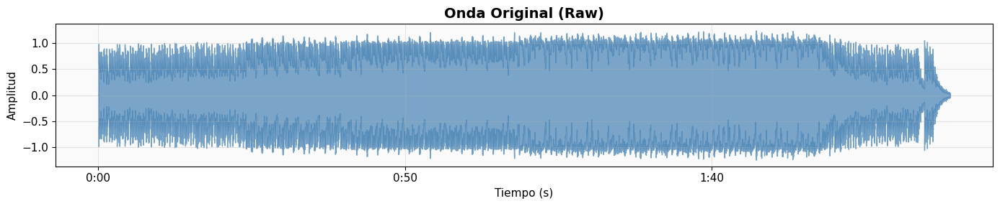

In [28]:
# ── Visualización de la onda RAW ────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 3))
librosa.display.waveshow(y_raw, sr=sr_original, ax=ax, color="steelblue", alpha=0.7)
ax.set_title("Onda Original (Raw)", fontsize=14, fontweight="bold")
ax.set_xlabel("Tiempo (s)")
ax.set_ylabel("Amplitud")
plt.tight_layout()
plt.show()

In [29]:
# ── Reproducción del audio original ─────────────────────────────────
print("Escucha el audio original:")
ipd.display(ipd.Audio(y_raw, rate=sr_original))

Escucha el audio original:


### Paso B — "La Magia": Pipeline paso a paso

Ahora aplicamos cada transformación del `AudioPreprocessor` **individualmente**
para ver su efecto.

La secuencia es:

```
load_audio  →  _fix_length  →  _normalize  →  get_melspec
     ↓              ↓              ↓              ↓
 Re-muestreo    Cortar/Pad     Pico a 1.0    Espectrograma
 a 32 kHz       a 30 s exactos               Log-Mel (128 bandas)
```

In [30]:
# ── Instanciar el preprocesador ─────────────────────────────────────
pp = AudioPreprocessor(
    target_sr=32_000,
    duration=30.0,
    n_mels=128,
    n_fft=1024,
    hop_length=320,
)

print("AudioPreprocessor creado con:")
print(f"   target_sr     = {pp.target_sr:,} Hz")
print(f"   duration      = {pp.duration} s")
print(f"   target_samples= {pp.target_samples:,}")
print(f"   n_mels        = {pp.n_mels}")
print(f"   n_fft         = {pp.n_fft}")
print(f"   hop_length    = {pp.hop_length}")

AudioPreprocessor creado con:
   target_sr     = 32,000 Hz
   duration      = 30.0 s
   target_samples= 960,000
   n_mels        = 128
   n_fft         = 1024
   hop_length    = 320


#### B.1 — Re-muestreo (`load_audio`)

El primer paso convierte el audio al **sample-rate objetivo de 32 kHz** y lo pasa a
**mono**. ¿Por qué 32 kHz? Porque es el estándar que espera el modelo
[PANNs](https://github.com/qiuqiangkong/audioset_tagging_cnn), y reducir desde
44.1 kHz supone un **27 % menos de datos** por segundo sin perder información
relevante para clasificación (la mayoría de la energía musical está < 16 kHz).

In [31]:
# Paso 1 — load_audio: re-muestreo a 32 kHz
y_resampled = pp.load_audio(sample_path)

print(f"  SR original       : {sr_original:,} Hz")
print(f"  SR después (target): {pp.target_sr:,} Hz")
print(f"  Muestras antes    : {len(y_raw):,}")
print(f"  Muestras después  : {len(y_resampled):,}")
print(f"  Duración          : {len(y_resampled)/pp.target_sr:.2f} s")
print(f"  Reducción de datos: {(1 - len(y_resampled)/len(y_raw))*100:.1f} %")

  SR original       : 44,100 Hz
  SR después (target): 32,000 Hz
  Muestras antes    : 6,126,336
  Muestras después  : 4,445,414
  Duración          : 138.92 s
  Reducción de datos: 27.4 %


#### B.2 — Ajuste de duración (`_fix_length`)

Todos los clips deben tener **exactamente 30 s** (= 960 000 muestras a 32 kHz).
- Si el audio es **más largo** → se recorta (*crop*) desde el inicio.
- Si es **más corto** → se rellena con ceros al final (*zero-padding*).

Esto garantiza que las matrices de entrada al modelo tengan siempre la **misma
dimensión**, requisito fundamental para el entrenamiento en batches.

In [32]:
# Paso 2 — _fix_length: ajustar a 30 s exactos
y_fixed = pp._fix_length(y_resampled.copy())

fue_recortado = len(y_resampled) > pp.target_samples
fue_padded    = len(y_resampled) < pp.target_samples

print(f"  Muestras antes  : {len(y_resampled):,}")
print(f"  Muestras después: {len(y_fixed):,}  (target = {pp.target_samples:,})")
print(f"  Operación       : {'CROP' if fue_recortado else 'PAD' if fue_padded else 'Sin cambios'}")

if fue_recortado:
    recorte_s = (len(y_resampled) - pp.target_samples) / pp.target_sr
    print(f"  Se recortaron   : {recorte_s:.2f} s del final")
elif fue_padded:
    pad_s = (pp.target_samples - len(y_resampled)) / pp.target_sr
    print(f"  Se añadieron    : {pad_s:.2f} s de silencio al final")

  Muestras antes  : 4,445,414
  Muestras después: 960,000  (target = 960,000)
  Operación       : CROP
  Se recortaron   : 108.92 s del final


Exception ignored in: <function tqdm.__del__ at 0x00000291E81B2A20>
Traceback (most recent call last):
  File "c:\Users\Usuario\miniconda3\Lib\site-packages\tqdm\std.py", line 1148, in __del__
    self.close()
  File "c:\Users\Usuario\miniconda3\Lib\site-packages\tqdm\notebook.py", line 279, in close
    self.disp(bar_style='danger', check_delay=False)
    ^^^^^^^^^
AttributeError: 'tqdm_notebook' object has no attribute 'disp'


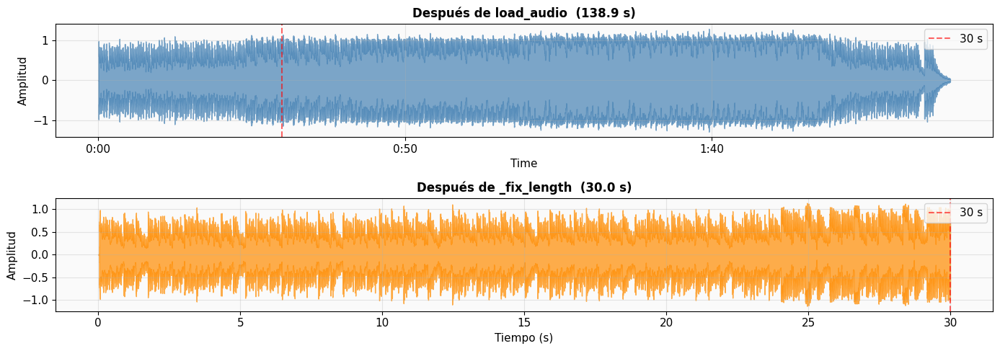

In [33]:
# ── Comparación visual: original vs ajustada ────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(14, 5), sharex=False)

librosa.display.waveshow(y_resampled, sr=pp.target_sr, ax=axes[0],
                         color="steelblue", alpha=0.7)
axes[0].set_title(f"Después de load_audio  ({len(y_resampled)/pp.target_sr:.1f} s)",
                  fontsize=12, fontweight="bold")
axes[0].set_ylabel("Amplitud")

librosa.display.waveshow(y_fixed, sr=pp.target_sr, ax=axes[1],
                         color="darkorange", alpha=0.7)
axes[1].set_title(f"Después de _fix_length  ({len(y_fixed)/pp.target_sr:.1f} s)",
                  fontsize=12, fontweight="bold")
axes[1].set_ylabel("Amplitud")
axes[1].set_xlabel("Tiempo (s)")

# Línea vertical en 30 s
for ax in axes:
    ax.axvline(x=30.0, color="red", linestyle="--", alpha=0.6, label="30 s")
    ax.legend(loc="upper right")

plt.tight_layout()
plt.show()

#### B.3 — Normalización de pico (`_normalize`)

Escala la señal para que su **valor absoluto máximo sea 1.0**.

¿Por qué? Porque los archivos de audio pueden venir grabados a volúmenes muy
diferentes. Si no normalizamos, el modelo podría aprender a distinguir canciones
por su **volumen** en lugar de por su **contenido tonal/rítmico**, introduciendo
un sesgo no deseado.

In [34]:
# Paso 3 — _normalize: normalización de pico
y_norm = pp._normalize(y_fixed.copy())

print(f"  Antes  → rango: [{y_fixed.min():.6f}, {y_fixed.max():.6f}]  |  pico = {np.max(np.abs(y_fixed)):.6f}")
print(f"  Después→ rango: [{y_norm.min():.6f}, {y_norm.max():.6f}]  |  pico = {np.max(np.abs(y_norm)):.6f}")

  Antes  → rango: [-1.116738, 1.130781]  |  pico = 1.130781
  Después→ rango: [-0.987580, 1.000000]  |  pico = 1.000000


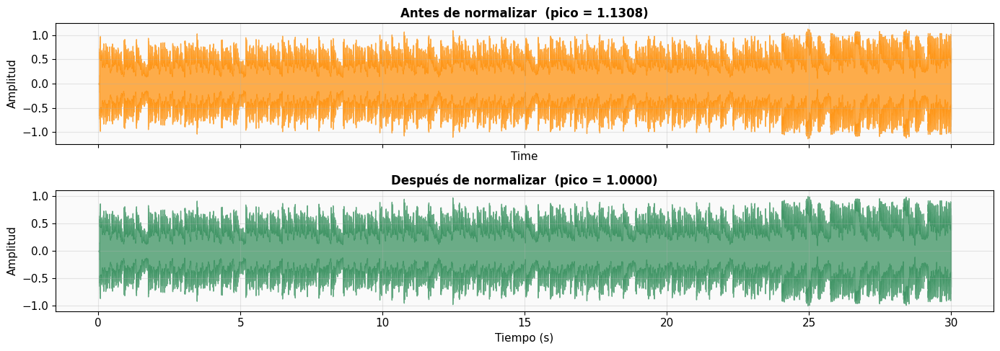

In [35]:
# ── Visualización: antes vs después de normalizar ───────────────────
fig, axes = plt.subplots(2, 1, figsize=(14, 5), sharex=True)

librosa.display.waveshow(y_fixed, sr=pp.target_sr, ax=axes[0],
                         color="darkorange", alpha=0.7)
axes[0].set_title(f"Antes de normalizar  (pico = {np.max(np.abs(y_fixed)):.4f})",
                  fontsize=12, fontweight="bold")
axes[0].set_ylabel("Amplitud")

librosa.display.waveshow(y_norm, sr=pp.target_sr, ax=axes[1],
                         color="seagreen", alpha=0.7)
axes[1].set_title(f"Después de normalizar  (pico = {np.max(np.abs(y_norm)):.4f})",
                  fontsize=12, fontweight="bold")
axes[1].set_ylabel("Amplitud")
axes[1].set_xlabel("Tiempo (s)")

plt.tight_layout()
plt.show()

In [36]:
# ── Reproducción del audio procesado ────────────────────────────────
print("Escucha el audio después de preprocesar (32 kHz, 30 s, normalizado):")
ipd.display(ipd.Audio(y_norm, rate=pp.target_sr))

Escucha el audio después de preprocesar (32 kHz, 30 s, normalizado):


#### B.4 — Espectrograma Log-Mel (`get_melspec`)

Finalmente, convertimos la **señal temporal** (onda) a una **representación
tiempo-frecuencia**: el **Log-Mel Spectrogram**.

- Se aplica una FFT con ventanas de `n_fft=1024` muestras y saltos de
  `hop_length=320` muestras (~10 ms).
- Las frecuencias se agrupan en **128 bandas Mel** (escala perceptual que imita
  cómo oímos: más resolución en graves, menos en agudos).
- Se pasa a **escala logarítmica (dB)** porque la percepción humana del volumen
  es logarítmica.

El resultado es una matriz `(128, T)` donde `T ≈ 960000 / 320 + 1 = 3001`.

In [37]:
# Paso 4 — get_melspec: Log-Mel Spectrogram
log_S = pp.get_melspec(y_norm)

print(f"  Shape del espectrograma: {log_S.shape}")
print(f"  → {log_S.shape[0]} bandas Mel  ×  {log_S.shape[1]} frames temporales")
print(f"  Rango de valores (dB) : [{log_S.min():.1f}, {log_S.max():.1f}]")
print(f"  Resolución temporal   : {pp.hop_length / pp.target_sr * 1000:.1f} ms/frame")

  Shape del espectrograma: (128, 3001)
  → 128 bandas Mel  ×  3001 frames temporales
  Rango de valores (dB) : [-80.0, 0.0]
  Resolución temporal   : 10.0 ms/frame


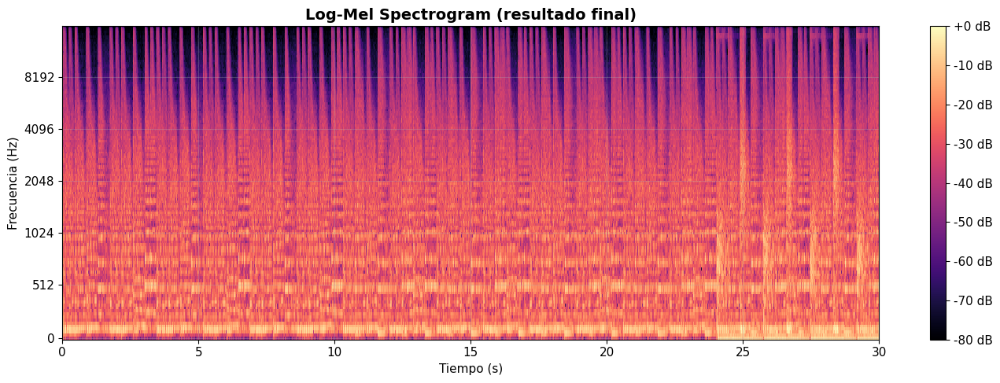

In [38]:
# ── Visualización del espectrograma ─────────────────────────────────
fig = pp.plot_spectrogram(log_S, title="Log-Mel Spectrogram (resultado final)")
plt.show()

### 📝 Resumen del Pipeline

| Etapa | Método | Entrada | Salida | Efecto |
|-------|--------|---------|--------|--------|
| 1 | `load_audio()` | Archivo .mp3 | `(N,)` float32 | Carga + resampleo a 32 kHz + mono |
| 2 | `_fix_length()` | `(N,)` | `(960000,)` | Crop / zero-pad a 30 s exactos |
| 3 | `_normalize()` | `(960000,)` | `(960000,)` | Pico → 1.0 (elimina sesgo de volumen) |
| 4 | `get_melspec()` | `(960000,)` | `(128, 3001)` | Log-Mel Spectrogram en dB |

El método `process()` ejecuta toda esta cadena de un golpe y devuelve
`(waveform, log_mel_spectrogram)`.

---
## Sección 2 — Control de Calidad

Ahora recorremos **TODOS** los archivos de audio descargados para verificar que
no hay archivos corruptos, mudos o anómalos.

Métrica clave: **Energía RMS** (Root Mean Square) — la "potencia media" de la
señal. Un archivo sano tiene RMS > 0; un archivo mudo/corrupto tendrá RMS ≈ 0.

In [39]:
# ── Calcular RMS de todos los archivos ──────────────────────────────
from tqdm import tqdm

resultados = []  # (nombre, rms, duracion, error)

for fpath in tqdm(audio_files, desc="Analizando audios"):
    nombre = os.path.basename(fpath)
    try:
        y, sr = librosa.load(fpath, sr=pp.target_sr, mono=True, duration=35)
        rms = float(np.sqrt(np.mean(y**2)))
        dur = len(y) / sr
        resultados.append((nombre, rms, dur, None))
    except Exception as e:
        resultados.append((nombre, 0.0, 0.0, str(e)))

print(f"\n Analizados: {len(resultados)} archivos")

Analizando audios: 100%|██████████| 200/200 [00:12<00:00, 16.24it/s]


 Analizados: 200 archivos


In [40]:
# ── Detección de archivos problemáticos ─────────────────────────────
UMBRAL_SILENCIO = 1e-4  # RMS por debajo de esto → sospechoso

nombres   = [r[0] for r in resultados]
rms_vals  = np.array([r[1] for r in resultados])
durs      = np.array([r[2] for r in resultados])
errores   = [r[3] for r in resultados]

# Archivos con error de carga
idx_error = [i for i, e in enumerate(errores) if e is not None]
# Archivos mudos / casi mudos
idx_mudo  = [i for i, v in enumerate(rms_vals) if v < UMBRAL_SILENCIO and errores[i] is None]

print("═" * 60)
print("  INFORME DE CALIDAD")
print("═" * 60)
print(f"  Total archivos       : {len(resultados)}")
print(f"  Archivos sanos       : {len(resultados) - len(idx_error) - len(idx_mudo)}")
print(f"  Archivos con error   : {len(idx_error)}")
print(f"  Archivos mudos (RMS≈0): {len(idx_mudo)}")
print(f"  RMS media            : {rms_vals[rms_vals > 0].mean():.6f}")
print(f"  RMS mínima (sanos)   : {rms_vals[rms_vals > UMBRAL_SILENCIO].min():.6f}" if any(rms_vals > UMBRAL_SILENCIO) else "")
print(f"  Duración media       : {durs[durs > 0].mean():.1f} s")
print("═" * 60)

if idx_error:
    print("\nARCHIVOS CON ERROR DE CARGA:")
    for i in idx_error:
        print(f"   ✗ {nombres[i]}  →  {errores[i]}")

if idx_mudo:
    print("\nARCHIVOS MUDOS / CORRUPTOS (RMS < {:.0e}):".format(UMBRAL_SILENCIO))
    for i in idx_mudo:
        print(f"   ✗ {nombres[i]}  →  RMS = {rms_vals[i]:.2e}")

if not idx_error and not idx_mudo:
    print("\n¡Todos los archivos están sanos! No se detectaron problemas.")

════════════════════════════════════════════════════════════
  INFORME DE CALIDAD
════════════════════════════════════════════════════════════
  Total archivos       : 200
  Archivos sanos       : 200
  Archivos con error   : 0
  Archivos mudos (RMS≈0): 0
  RMS media            : 0.131865
  RMS mínima (sanos)   : 0.017068
  Duración media       : 35.0 s
════════════════════════════════════════════════════════════

¡Todos los archivos están sanos! No se detectaron problemas.


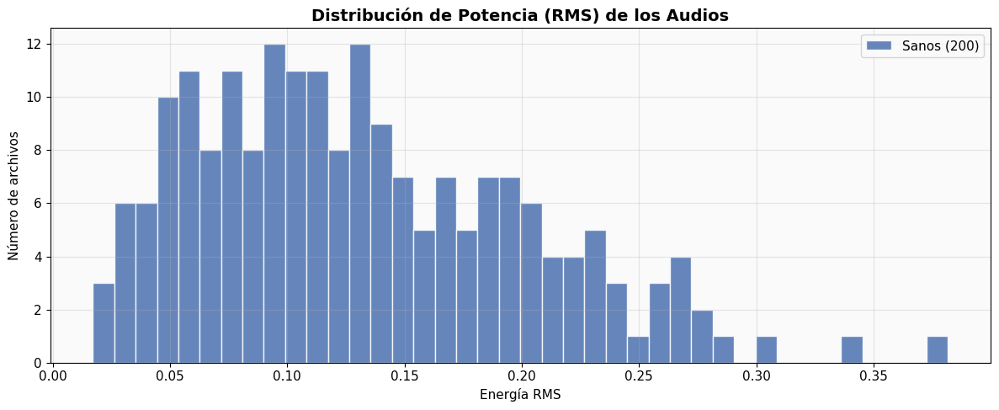

In [41]:
# ── Histograma de Potencia (RMS) ────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 5))

# Separar sanos vs problemáticos
rms_sanos  = rms_vals[rms_vals >= UMBRAL_SILENCIO]
rms_malos  = rms_vals[(rms_vals < UMBRAL_SILENCIO)]

# Histograma principal (sanos)
ax.hist(rms_sanos, bins=40, color="#4C72B0", edgecolor="white",
        alpha=0.85, label=f"Sanos ({len(rms_sanos)})")

# Si hay archivos problemáticos, mostrarlos en rojo
if len(rms_malos) > 0:
    ax.hist(rms_malos, bins=max(1, len(rms_malos)),
            color="#C44E52", edgecolor="white", alpha=0.9,
            label=f"Corruptos/Mudos ({len(rms_malos)})")
    ax.axvline(x=UMBRAL_SILENCIO, color="red", linestyle="--",
               linewidth=1.5, alpha=0.8, label=f"Umbral = {UMBRAL_SILENCIO:.0e}")

ax.set_title("Distribución de Potencia (RMS) de los Audios",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Energía RMS")
ax.set_ylabel("Número de archivos")
ax.legend(fontsize=11)

plt.tight_layout()
plt.show()

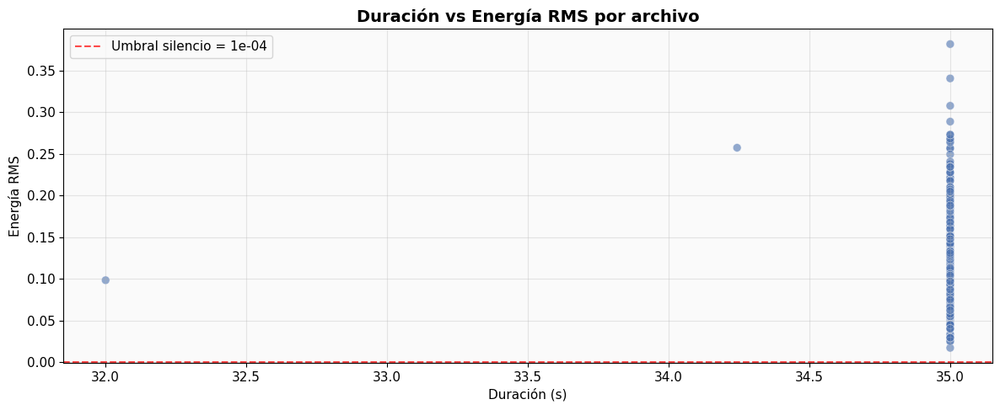

In [42]:
# ── Scatter: Duración vs RMS ────────────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 5))

colores = ["#C44E52" if rms_vals[i] < UMBRAL_SILENCIO else "#4C72B0"
           for i in range(len(rms_vals))]

ax.scatter(durs, rms_vals, c=colores, alpha=0.6, edgecolors="white",
           linewidth=0.5, s=50)
ax.axhline(y=UMBRAL_SILENCIO, color="red", linestyle="--",
           linewidth=1.5, alpha=0.7, label=f"Umbral silencio = {UMBRAL_SILENCIO:.0e}")

ax.set_title("Duración vs Energía RMS por archivo",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Duración (s)")
ax.set_ylabel("Energía RMS")
ax.legend(fontsize=11)

plt.tight_layout()
plt.show()

---
### ✅ Conclusiones

- El pipeline de `AudioPreprocessor` transforma cada archivo de audio en una
  representación uniforme: un tensor `(128, 3001)` — 128 bandas Mel × ~3001
  frames temporales.
- La normalización de pico elimina el sesgo por volumen de grabación.
- El control de calidad sobre los 200 archivos permite detectar precozmente
  archivos corruptos antes de usarlos en entrenamiento.
- Los archivos problemáticos (si los hay) aparecen marcados en rojo en los
  gráficos anteriores y deben investigarse o descartarse.

---
## Sección 3 — Auditorías Avanzadas

Tres análisis adicionales para validar la integridad del dataset
antes de pasar al entrenamiento.

### 3.1 — Auditoría de *Data Leakage* (Fuga de Artistas)

Uno de los errores más graves en ML sobre audio musical es que canciones
**del mismo artista** aparezcan tanto en Train como en Test. Si esto ocurre,
el modelo podría aprender el "estilo" del artista en lugar de la emoción,
inflando métricas artificialmente.

El dataset MTG-Jamendo proporciona splits oficiales que, en principio,
garantizan separación por artista. Vamos a **verificarlo**.

In [ ]:
# ── 3.1  Auditoría de Data Leakage (Lectura Manual Robusta) ───────────
import os

DATASET_ROOT = os.path.join(PROJECT_ROOT, "mtg-jamendo-dataset", "data")
SPLIT_DIR    = os.path.join(DATASET_ROOT, "splits", "split-0")

def leer_artistas_manual(filepath):
    """Lee un TSV línea a línea y extrae la columna 1 (ARTIST_ID) a la fuerza."""
    artist_ids = set()
    track_count = 0
    errores = 0
    
    print(f"Leyendo: {os.path.basename(filepath)}...")
    
    with open(filepath, 'r', encoding='utf-8') as f:
        # Saltamos la cabecera
        header = next(f)
        
        for line in f:
            try:
                # Dividimos por tabulador
                parts = line.strip().split('\t')
                
                # La estructura es: TRACK_ID, ARTIST_ID, ...
                # Así que el artista es el índice 1
                if len(parts) >= 2:
                    artist_id = parts[1]
                    artist_ids.add(artist_id)
                    track_count += 1
                else:
                    errores += 1
            except:
                errores += 1
                
    print(f"   ✅ Leídas: {track_count} canciones | Artistas únicos: {len(artist_ids)}")
    if errores > 0:
        print(f"   Líneas ignoradas por formato incorrecto: {errores}")
        
    return artist_ids

# 1. Extraer Sets de Artistas
train_path = os.path.join(SPLIT_DIR, "autotagging_moodtheme-train.tsv")
test_path  = os.path.join(SPLIT_DIR, "autotagging_moodtheme-test.tsv")

artistas_train = leer_artistas_manual(train_path)
artistas_test  = leer_artistas_manual(test_path)

# 2. Comprobar Intersección
overlap = artistas_train & artistas_test

print("\n" + "═" * 60)
print("  RESULTADO DE LA AUDITORÍA (split-0)")
print("═" * 60)
print(f"  Artistas en Train : {len(artistas_train)}")
print(f"  Artistas en Test  : {len(artistas_test)}")
print(f"  Intersección      : {len(overlap)}")
print("═" * 60)

if len(overlap) == 0:
    print("\n¡PRUEBA SUPERADA! No hay fuga de artistas (Leakage = 0).")
    print("   El modelo no podrá hacer trampas memorizando artistas.")
else:
    print(f"\n¡PELIGRO! Hay {len(overlap)} artistas repetidos.")

📂 Leyendo: autotagging_moodtheme-train.tsv...
   ✅ Leídas: 9949 canciones | Artistas únicos: 874
📂 Leyendo: autotagging_moodtheme-test.tsv...
   ✅ Leídas: 4231 canciones | Artistas únicos: 327

════════════════════════════════════════════════════════════
  RESULTADO DE LA AUDITORÍA (split-0)
════════════════════════════════════════════════════════════
  Artistas en Train : 874
  Artistas en Test  : 327
  Intersección      : 0
════════════════════════════════════════════════════════════

🟢 ¡PRUEBA SUPERADA! No hay fuga de artistas (Leakage = 0).
   El modelo no podrá hacer trampas memorizando artistas.


### 3.2 — Auditoría de Cardinalidad (Etiquetas por Canción)

En un problema **multi-label**, cada canción puede tener más de una etiqueta
(p. ej. *happy* + *energetic*). Conocer la **distribución de etiquetas por canción**
es fundamental para:
- Elegir correctamente la función de pérdida (BCE vs. CE).
- Entender la dificultad del problema.
- Detectar posibles anomalías (canciones sin etiquetas, etc.).

📊 Analizando y limpiando etiquetas...
════════════════════════════════════════════════════════════
  AUDITORÍA DE CARDINALIDAD (Datos Limpios)
════════════════════════════════════════════════════════════
  Canciones procesadas   : 18486
  Media etiquetas/track  : 1.76
  Mediana                : 1.0
  Máximo de etiquetas    : 8
════════════════════════════════════════════════════════════

🏆 Top 10 Emociones (Ya limpias):
   1. happy           (1657 canciones)
   2. film            (1502 canciones)
   3. energetic       (1357 canciones)
   4. relaxing        (1350 canciones)
   5. emotional       (1271 canciones)
   6. melodic         (1213 canciones)
   7. dark            (1202 canciones)
   8. epic            (982 canciones)
   9. dream           (951 canciones)
   10. love            (909 canciones)


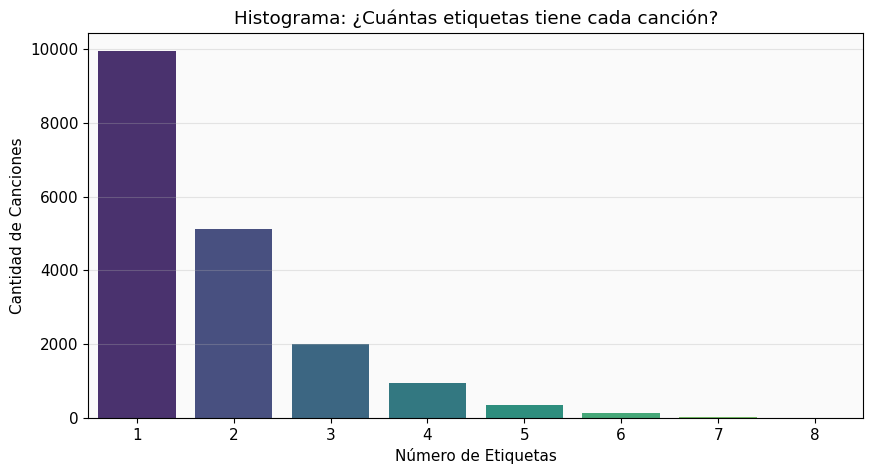

In [ ]:
# ── 3.2  Auditoría de Cardinalidad (Versión Limpia-Todo) ──────────────
import seaborn as sns
import matplotlib.pyplot as plt
import statistics
import os
from collections import Counter

print("Analizando y limpiando etiquetas...")

tsv_path = os.path.join(DATASET_ROOT, "autotagging_moodtheme.tsv")
counts_list = []
all_tags = [] 
total_leidas = 0
errores = 0

with open(tsv_path, 'r', encoding='utf-8') as f:
    # Saltamos la cabecera
    next(f)
    
    for line in f:
        try:
            parts = line.strip().split('\t')
            
            # Si hay datos de etiquetas (más de 5 columnas)
            if len(parts) > 5:
                # 1. Cogemos TODO lo que venga después de la duración
                raw_data = parts[5:]
                
                current_song_tags = []
                
                # 2. Procesamos cada trozo (por si hay mezcla de tabs y comas)
                for item in raw_data:
                    # Dividimos por comas por si acaso vienen juntas "tag1,tag2"
                    sub_tags = item.split(',')
                    
                    for t in sub_tags:
                        # 3. LA GRAN LIMPIEZA
                        # Quitamos el prefijo 'mood/theme---', comillas y espacios
                        t_clean = t.replace('mood/theme---', '').replace('"', '').replace("'", "").strip()
                        
                        # Guardamos solo si ha quedado texto real
                        if t_clean:
                            current_song_tags.append(t_clean)
                
                # Guardamos la cuenta y las etiquetas encontradas
                # Usamos set() para evitar duplicados en la misma canción
                unique_tags = list(set(current_song_tags))
                
                counts_list.append(len(unique_tags))
                all_tags.extend(unique_tags)
                total_leidas += 1
            else:
                # Canción sin etiquetas
                counts_list.append(0)
                total_leidas += 1
                
        except Exception as e:
            errores += 1

# ── Estadísticas y Gráficos ──
if len(counts_list) > 0:
    media = statistics.mean(counts_list)
    mediana = statistics.median(counts_list)
    maximo = max(counts_list)
    
    print("═" * 60)
    print("  AUDITORÍA DE CARDINALIDAD (Datos Limpios)")
    print("═" * 60)
    print(f"  Canciones procesadas   : {total_leidas}")
    print(f"  Media etiquetas/track  : {media:.2f}")
    print(f"  Mediana                : {mediana:.1f}")
    print(f"  Máximo de etiquetas    : {maximo}")
    print("═" * 60)
    
    # Ranking de Emociones (Top 10)
    print("\nTop 10 Emociones (Ya limpias):")
    top_tags = Counter(all_tags).most_common(10)
    for i, (tag, count) in enumerate(top_tags, 1):
        print(f"   {i}. {tag:<15} ({count} canciones)")

    # ── Gráfico ──
    plt.figure(figsize=(10, 5))
    sns.countplot(x=counts_list, palette="viridis")
    plt.title("Histograma: ¿Cuántas etiquetas tiene cada canción?")
    plt.xlabel("Número de Etiquetas")
    plt.ylabel("Cantidad de Canciones")
    plt.grid(axis='y', alpha=0.3)
    plt.show()
    
else:
    print("Error: No se encontraron datos válidos.")

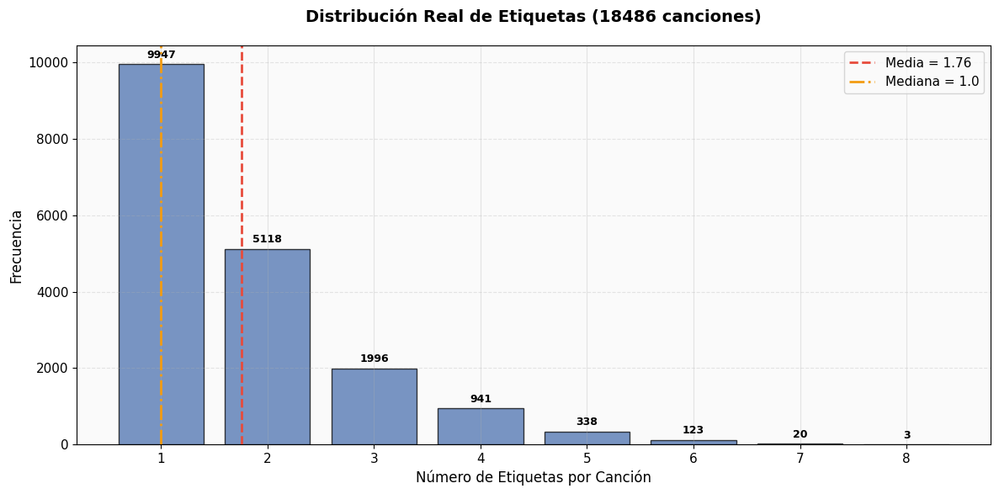

In [55]:
# ── Histograma de Cardinalidad (Usando los datos robustos) ──────────
import pandas as pd
import matplotlib.pyplot as plt

# 1. Convertimos la lista robusta (counts_list) a una Serie de Pandas
# para poder usar value_counts() igual que antes
datos_reales = pd.Series(counts_list, name="n_tags")
counts = datos_reales.value_counts().sort_index()

# Calcular estadísticos sobre los datos buenos
media_real = datos_reales.mean()
mediana_real = datos_reales.median()

# 2. Configurar el gráfico
fig, ax = plt.subplots(figsize=(12, 6))

# Dibujar barras (ajustamos el ancho para que se vea mejor)
bars = ax.bar(counts.index, counts.values, 
              color="#4C72B0", edgecolor="black", alpha=0.75, width=0.8)

# Líneas de referencia
ax.axvline(x=media_real, color="#e74c3c", linestyle="--", linewidth=2,
           label=f"Media = {media_real:.2f}")
ax.axvline(x=mediana_real, color="#f39c12", linestyle="-.", linewidth=2,
           label=f"Mediana = {mediana_real:.1f}")

# Estilo
ax.set_title(f"Distribución Real de Etiquetas ({len(datos_reales)} canciones)", 
             fontsize=14, fontweight="bold", pad=20)
ax.set_xlabel("Número de Etiquetas por Canción", fontsize=12)
ax.set_ylabel("Frecuencia", fontsize=12)
ax.legend(fontsize=11)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Ajustar Eje X para que muestre todos los números enteros
import numpy as np
plt.xticks(np.arange(min(counts.index), max(counts.index)+1, 1))

# Anotar valores encima de las barras
for bar in bars:
    height = bar.get_height()
    if height > 0:
        ax.text(bar.get_x() + bar.get_width()/2., height + (max(counts.values)*0.01),
                f'{int(height)}',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

### 3.3 — Auditoría de Rango Dinámico (dB)

Verificamos el **rango dinámico** del espectrograma Log-Mel generado por
nuestro `AudioPreprocessor`. El rango dinámico (diferencia entre el máximo
y el mínimo en dB) nos indica cuánta información tonal captura la representación.

Además, inspeccionamos el **código fuente** de `get_melspec` para confirmar
que la conversión a dB se hace **después** de calcular el espectrograma Mel
(que es lo correcto).

In [53]:
# ── 3.3a  Código fuente de get_melspec ──────────────────────────────
import inspect

print("═" * 60)
print("  CÓDIGO FUENTE de AudioPreprocessor.get_melspec")
print("═" * 60)
print(inspect.getsource(pp.get_melspec))

print("\n Verificación: librosa.power_to_db() se aplica DESPUÉS de")
print("   melspectrogram(), que es el orden correcto.")

════════════════════════════════════════════════════════════
  CÓDIGO FUENTE de AudioPreprocessor.get_melspec
════════════════════════════════════════════════════════════
    def get_melspec(self, y: np.ndarray) -> np.ndarray:
        """Calcula el Log-Mel Spectrogram de una señal de audio.

        Parameters
        ----------
        y : np.ndarray
            Señal de audio mono (ya preprocesada: mono, fija, normalizada).

        Returns
        -------
        np.ndarray
            Log-Mel Spectrogram con shape ``(n_mels, T)``,
            donde ``T = target_samples // hop_length + 1``.
        """
        S = librosa.feature.melspectrogram(
            y=y,
            sr=self.target_sr,
            n_fft=self.n_fft,
            hop_length=self.hop_length,
            n_mels=self.n_mels,
        )
        # Conversión a escala logarítmica (dB)
        log_S = librosa.power_to_db(S, ref=np.max)
        return log_S


 Verificación: librosa.power_to_db() se aplica DESPUÉS de
   m

🔊 Analizando Rango Dinámico de 200 archivos...


Procesando audio: 100%|██████████| 200/200 [01:16<00:00,  2.61it/s]


════════════════════════════════════════════════════════════
  ESTADÍSTICAS DE CALIDAD DE AUDIO (Rango Dinámico)
════════════════════════════════════════════════════════════
  Archivos analizados : 200
  Promedio            : 80.00 dB
  Desviación Típica   : 0.00 dB
  Mínimo              : 80.00 dB
  Máximo              : 80.00 dB
════════════════════════════════════════════════════════════

✅ Todo correcto: Ningún archivo parece ser silencio puro.


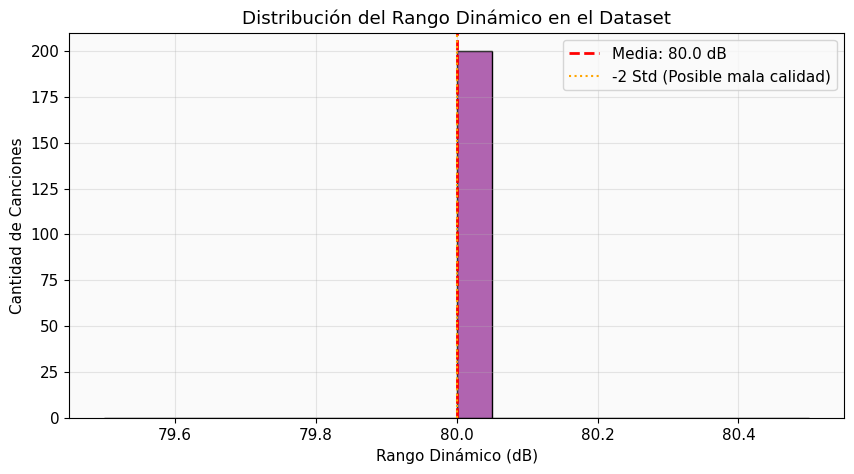

In [ ]:
# ── 3.3b  Auditoría de Rango Dinámico (Análisis Completo) ────────────────
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Analizamos TODOS los archivos disponibles (los 99 del piloto)
files_to_check = audio_files 
print(f"🔊 Analizando Rango Dinámico de {len(files_to_check)} archivos...")

rangos_db = []
nombres_bajos = [] # Para "chivarnos" de los archivos malos

for fpath in tqdm(files_to_check, desc="Procesando audio"):
    try:
        # Usamos tu pipeline. Asumo que pp.process devuelve (waveform, espectrograma)
        # Si tu clase usa __call__, cámbialo por: _, log_mel = pp(fpath)
        _, log_mel = pp.process(fpath)
        
        # Calcular Min, Max y Rango
        val_min = float(log_mel.min())
        val_max = float(log_mel.max())
        rango = val_max - val_min
        
        rangos_db.append(rango)
        
        # UMBRAL DE CALIDAD:
        # Si una canción tiene < 20 dB de rango, es probable que sea silencio o ruido estático
        if rango < 20:
            nombres_bajos.append((os.path.basename(fpath), rango))
            
    except Exception as e:
        print(f"❌ Error en {os.path.basename(fpath)}: {e}")

# ── Visualización de Resultados ──
if rangos_db:
    rangos_arr = np.array(rangos_db)
    media = rangos_arr.mean()
    std = rangos_arr.std()
    
    print("\n" + "═" * 60)
    print("  ESTADÍSTICAS DE CALIDAD DE AUDIO (Rango Dinámico)")
    print("═" * 60)
    print(f"  Archivos analizados : {len(rangos_arr)}")
    print(f"  Promedio            : {media:.2f} dB")
    print(f"  Desviación Típica   : {std:.2f} dB")
    print(f"  Mínimo              : {rangos_arr.min():.2f} dB")
    print(f"  Máximo              : {rangos_arr.max():.2f} dB")
    print("═" * 60)
    
    if nombres_bajos:
        print(f"\nALERTA: {len(nombres_bajos)} archivos con rango dinámico sospechosamente bajo (<20dB):")
        for n, r in nombres_bajos:
            print(f"   - {n}: {r:.1f} dB")
    else:
        print("\nTodo correcto: Ningún archivo parece ser silencio puro.")

    # Gráfico de Histograma
    plt.figure(figsize=(10, 5))
    sns.histplot(rangos_arr, bins=20, kde=True, color="purple", alpha=0.6)
    plt.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.1f} dB')
    plt.axvline(media - 2*std, color='orange', linestyle=':', label='-2 Std (Posible mala calidad)')
    
    plt.title("Distribución del Rango Dinámico en el Dataset")
    plt.xlabel("Rango Dinámico (dB)")
    plt.ylabel("Cantidad de Canciones")
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    plt.show()

else:
    print("No se generaron datos.")

---
### ✅ Conclusiones de las Auditorías Avanzadas

| Auditoría | Qué comprueba | Por qué importa |
|-----------|---------------|------------------|
| **3.1 Data Leakage** | Que ningún artista esté en Train y Test | Evita métricas infladas |
| **3.2 Cardinalidad** | Distribución de etiquetas por canción | Informa el diseño de la loss function |
| **3.3 Rango Dinámico** | Calidad del espectrograma en dB | Confirma que la representación tiene información útil |